In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import glob
import anndata as ad

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
em = sc.read('GSE166635_upm_log1p.h5ad')
em.obs

,sample,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden_0.4,cell type
HCC1_AAACCCAAGAAGAACG-1,HCC1,1729,1729,5173.0,413.0,7.983762,3,TAMs
HCC1_AAACCCAAGCAACAAT-1,HCC1,3782,3782,13257.0,905.0,6.826582,9,TAMs
HCC1_AAACCCAAGCATCTTG-1,HCC1,2750,2750,9418.0,721.0,7.655553,3,TAMs
HCC1_AAACCCAAGCTGAGTG-1,HCC1,1448,1447,4959.0,257.0,5.182497,0,HPCs
HCC1_AAACCCACAAGGGCAT-1,HCC1,2080,2080,8340.0,314.0,3.764988,0,HPCs
...,...,...,...,...,...,...,...,...
HCC2_TTTGTTGCAATACGCT-1,HCC2,487,487,824.0,52.0,6.310680,4,T cells
HCC2_TTTGTTGCACATACGT-1,HCC2,890,890,1929.0,130.0,6.739243,4,T cells
HCC2_TTTGTTGGTTAGAAGT-1,HCC2,1060,1060,2930.0,169.0,5.767918,4,T cells
HCC2_TTTGTTGTCGCCTAGG-1,HCC2,677,677,1832.0,138.0,7.532751,10,B cells


In [4]:
microb = sc.read_csv('GSE166635_invadeseq.csv')
microbList = list(microb.var.index)
len(microbList)

25

In [5]:
merged = ad.concat([em, microb], axis=1, merge='same', label='')
merged.obs = em.obs
merged.obsm = em.obsm
merged.obsp = em.obsp
#merged.var = em.var
#merged.varm = em.varm
merged

/data/hour/miniconda3/lib/python3.8/site-packages/anndata/_core/merge.py:942: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


AnnData object with n_obs × n_vars = 22341 × 2025
    obs: 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_0.4', 'cell type'
    var: ''
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    obsp: 'connectivities', 'distances'

In [6]:
microb = pd.read_csv('GSE166635_invadeseq.csv', index_col=0)
ctList = list(set(merged.obs['cell type']))
ptList = sorted(set(merged.obs['sample']))
ptList

['HCC1', 'HCC2']

# save data for downstream

In [7]:
# raw count
emraw = sc.read('GSE166635_count.h5ad')
emraw.obs = em.obs
emraw

AnnData object with n_obs × n_vars = 22341 × 23085
    obs: 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_0.4', 'cell type'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [8]:
for ct in ctList:
    adata = emraw[emraw.obs['cell type']==ct]
    mtx = adata.to_df().T
    for mb in microbList:
        adata.obs[mb] = merged[adata.obs.index,mb].to_df().values
    #print(adata.obs[microbList].astype(int))#group file
    label = adata.obs[microbList]
    label = label.loc[:,label.max()>0] #过滤没有的微生物列
    label[label!=0] = 1 #转换为二维
    label = label.loc[:,label.sum()>2] #过滤细胞较少的微生物列
    if len(label.columns)>0: #只输出有微生物的文件
        label.astype(int).to_csv('downstream/'+ct.replace('/','&')+'_label.csv',header=True, index=True,sep=',') #label file
        adata.obs['sample'].to_csv('downstream/'+ct.replace('/','&')+'_batch.csv',header=False, index=True,sep=',')#batch file
        mtx.astype(int).to_csv('downstream/'+ct.replace('/','&')+'_count.csv',header=True, index=True,sep=',')#count matrix

/tmp/ipykernel_440724/230215250.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[mb] = merged[adata.obs.index,mb].to_df().values
/tmp/ipykernel_440724/230215250.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[mb] = merged[adata.obs.index,mb].to_df().values
/tmp/ipykernel_440724/230215250.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[mb] = merged[adata.obs.index,mb].to_df().values
/tmp/ipykernel_440724/230215250.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[mb] = merged[adata.obs.index,mb].to_df().values
/tmp/ipykernel_440724/230215250.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[mb] = merged[adata.obs.index,mb].to_df().values
/tmp/

In [9]:
del emraw

# umap figures

/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


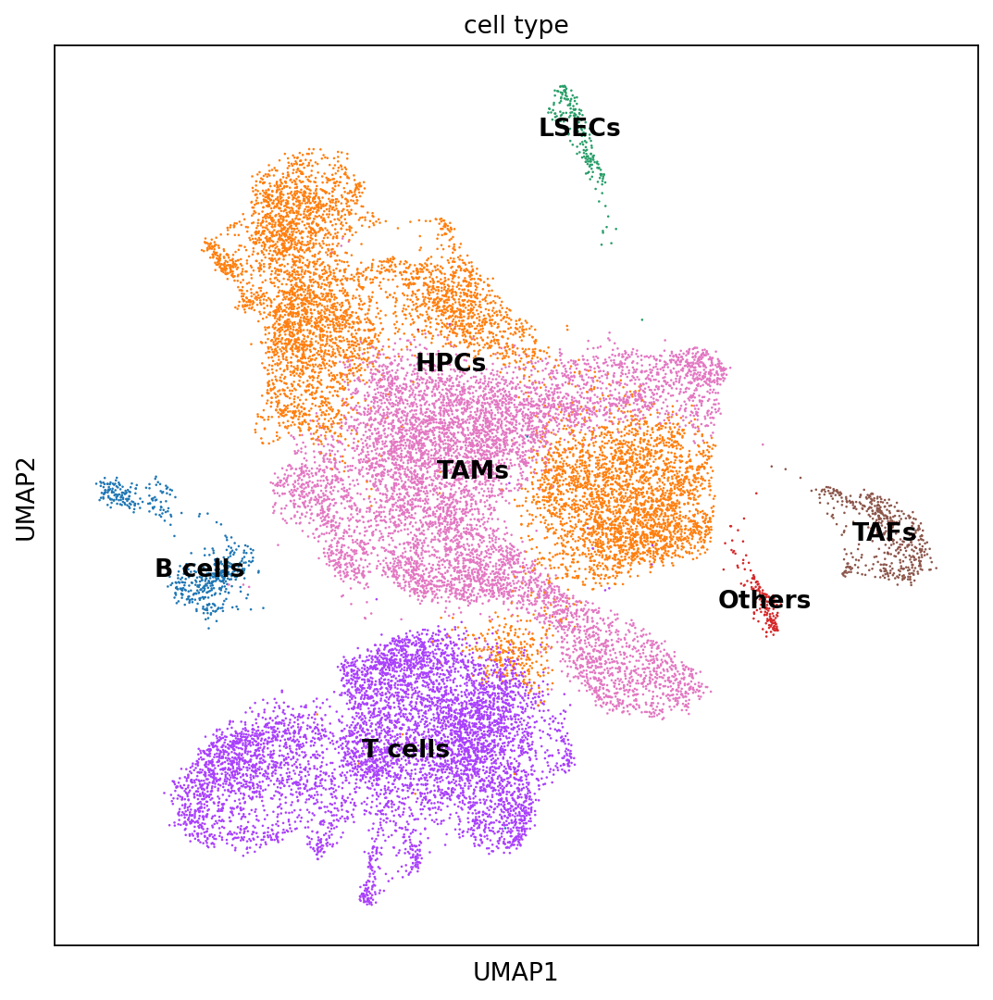

In [10]:
sc.settings.set_figure_params(fontsize=12, figsize=(8,8))
sc.pl.umap(merged, color=['cell type'], legend_loc='on data', palette=sc.pl.palettes.vega_20_scanpy)

/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


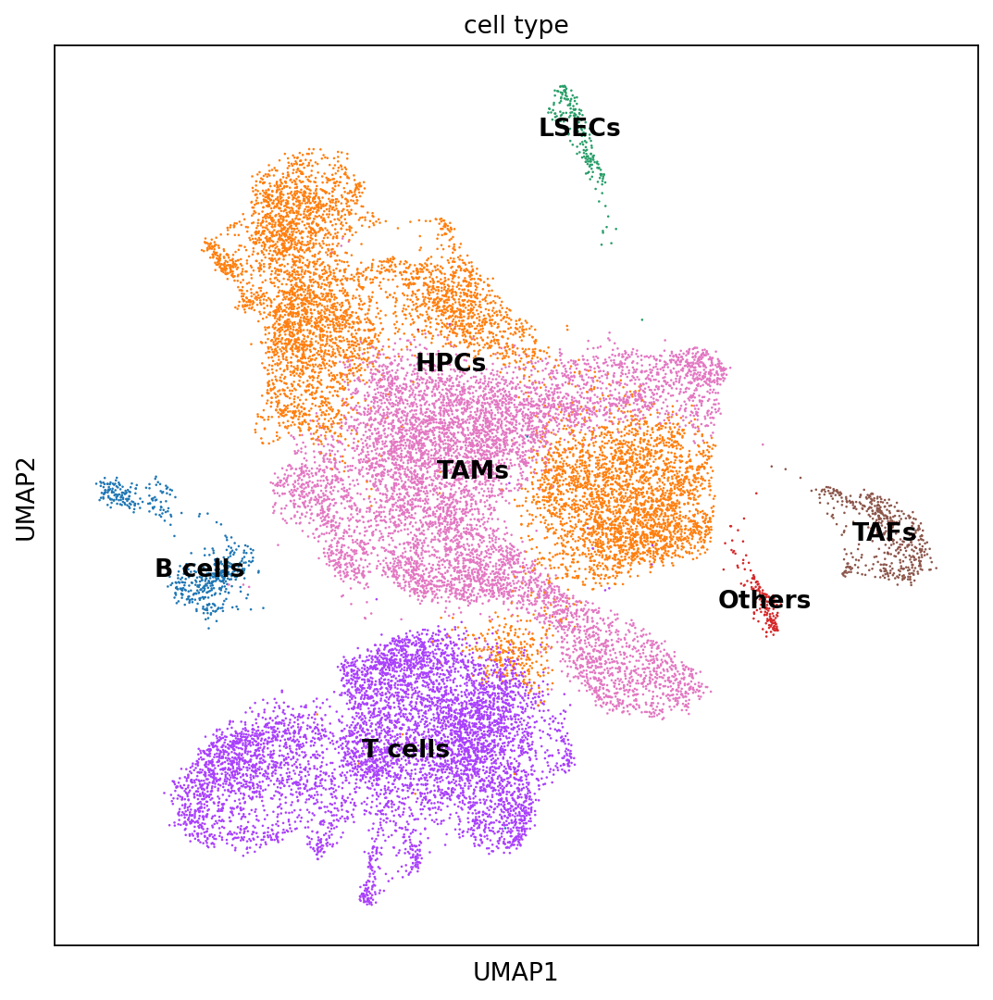

In [12]:
with plt.rc_context():  # Use this to set figure params like size and dpi
    sc.pl.umap(merged, color=['cell type'], legend_loc='on data', palette=sc.pl.palettes.vega_20_scanpy, show=False)
    plt.savefig("figures/distribution.pdf", bbox_inches="tight")

/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:199: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = pl.figure()


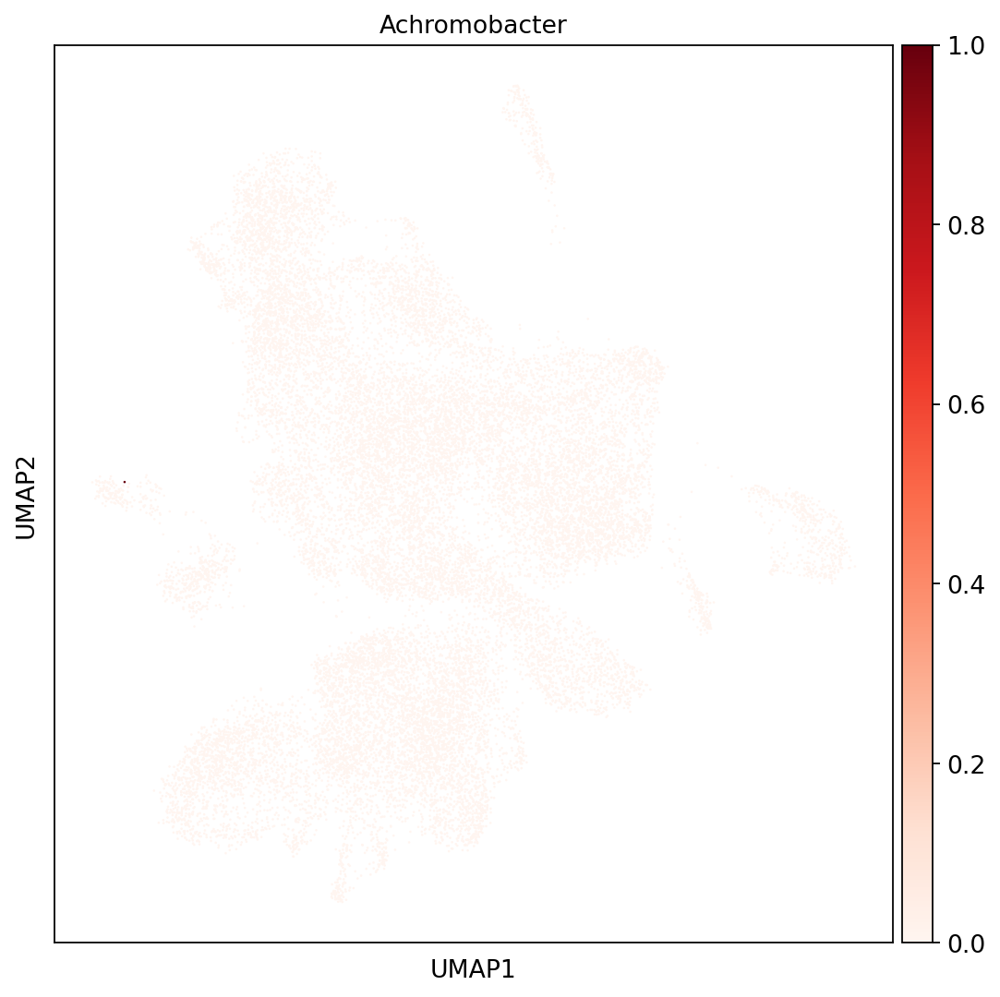

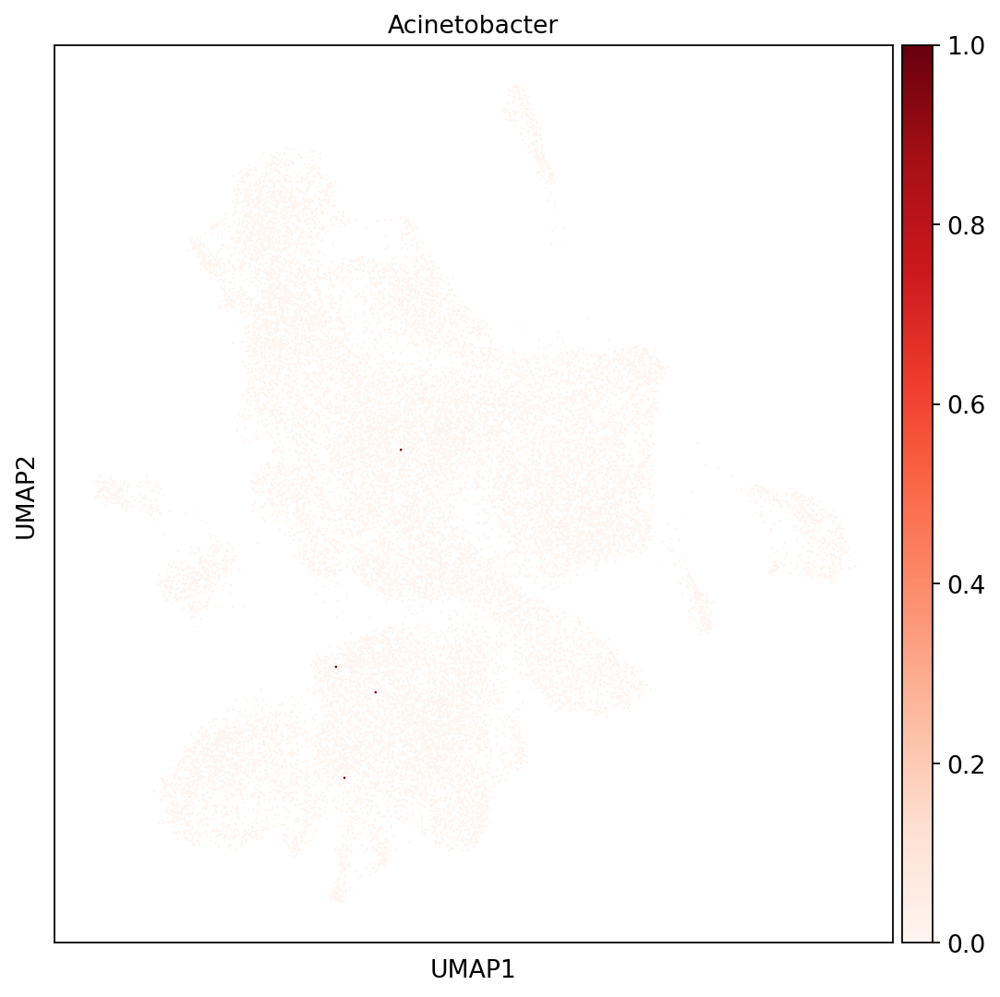

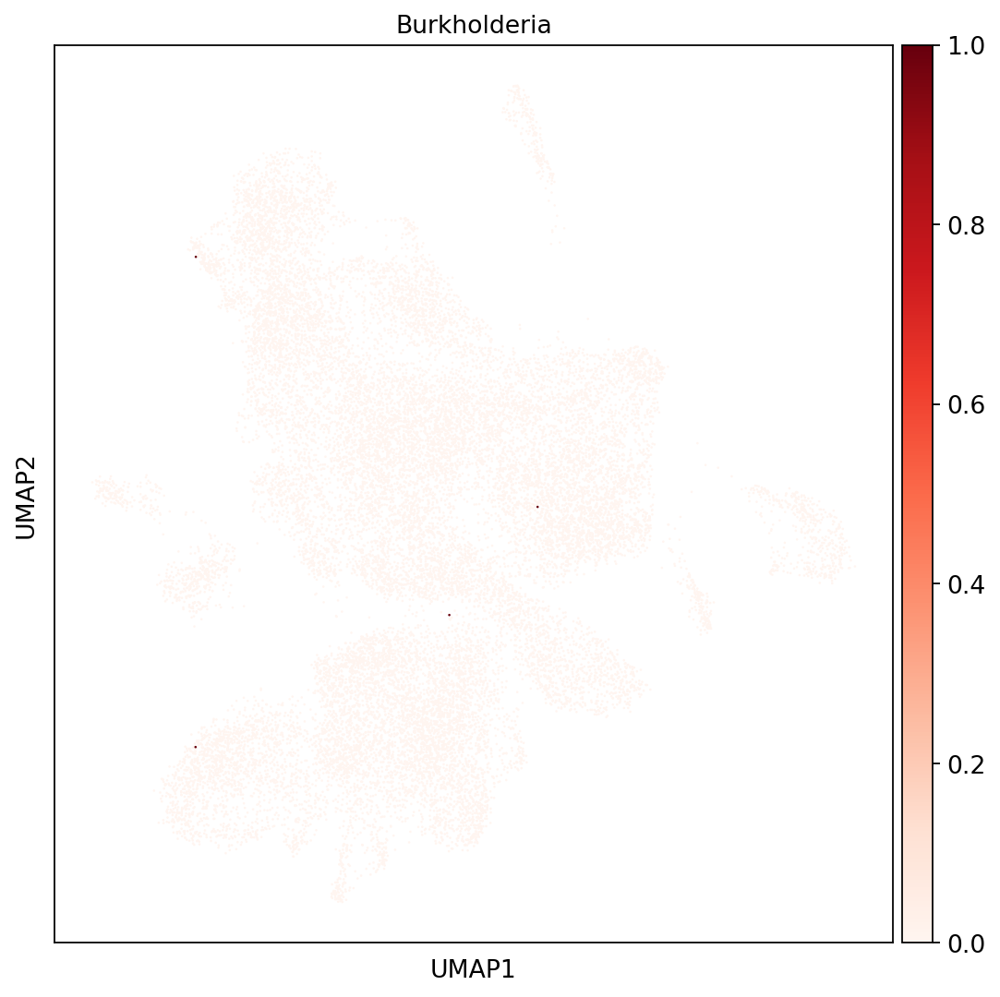

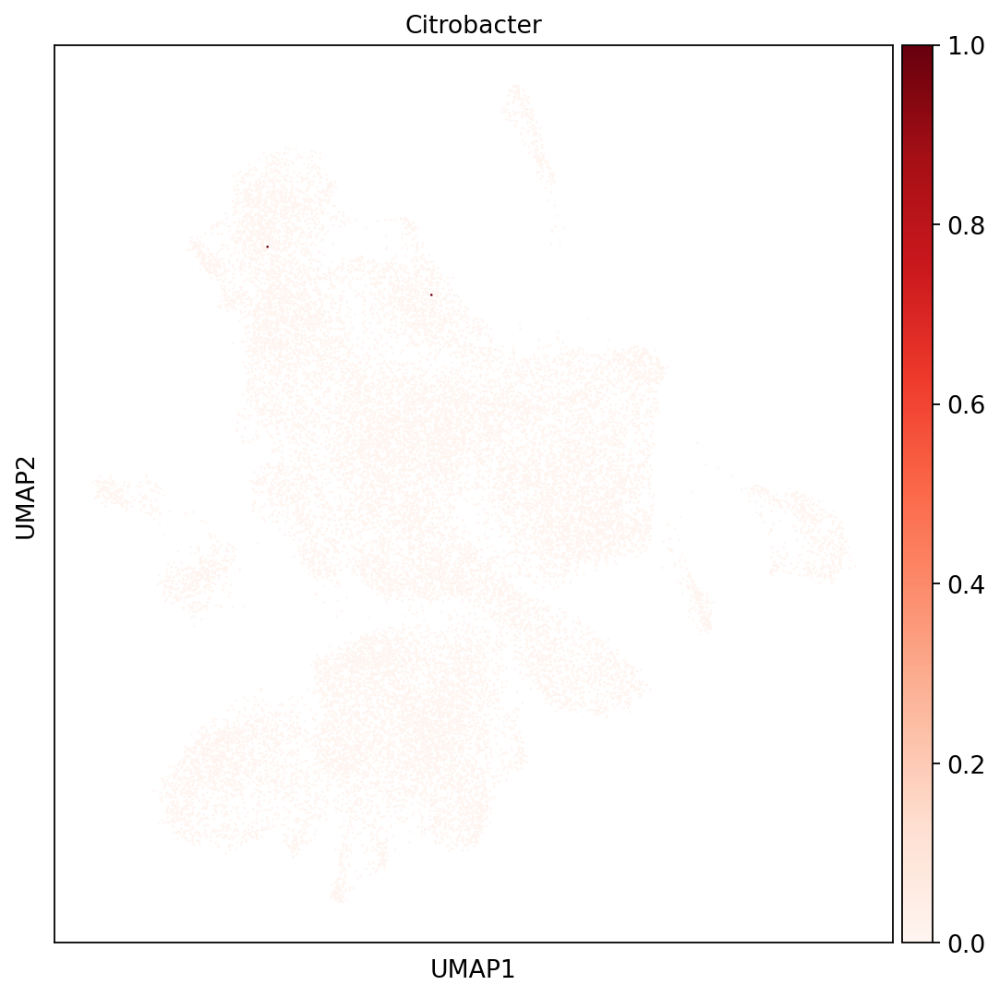

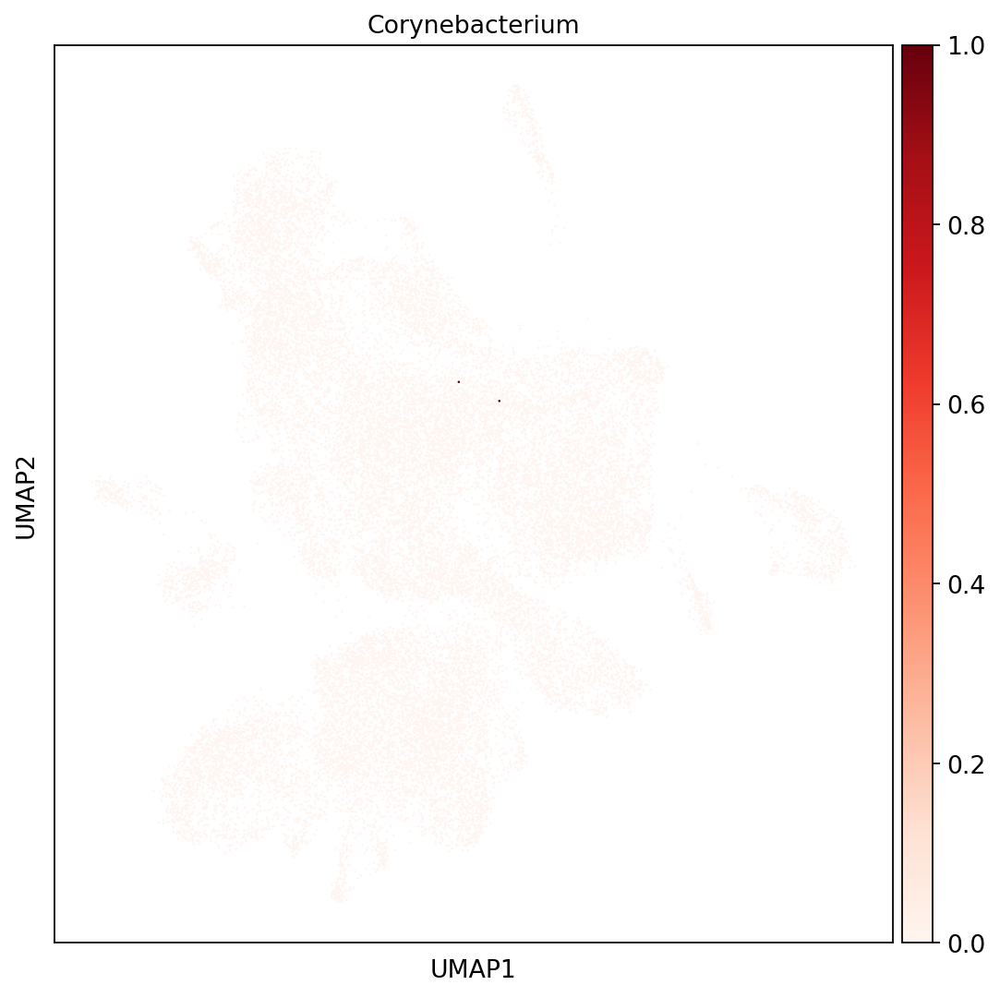

...

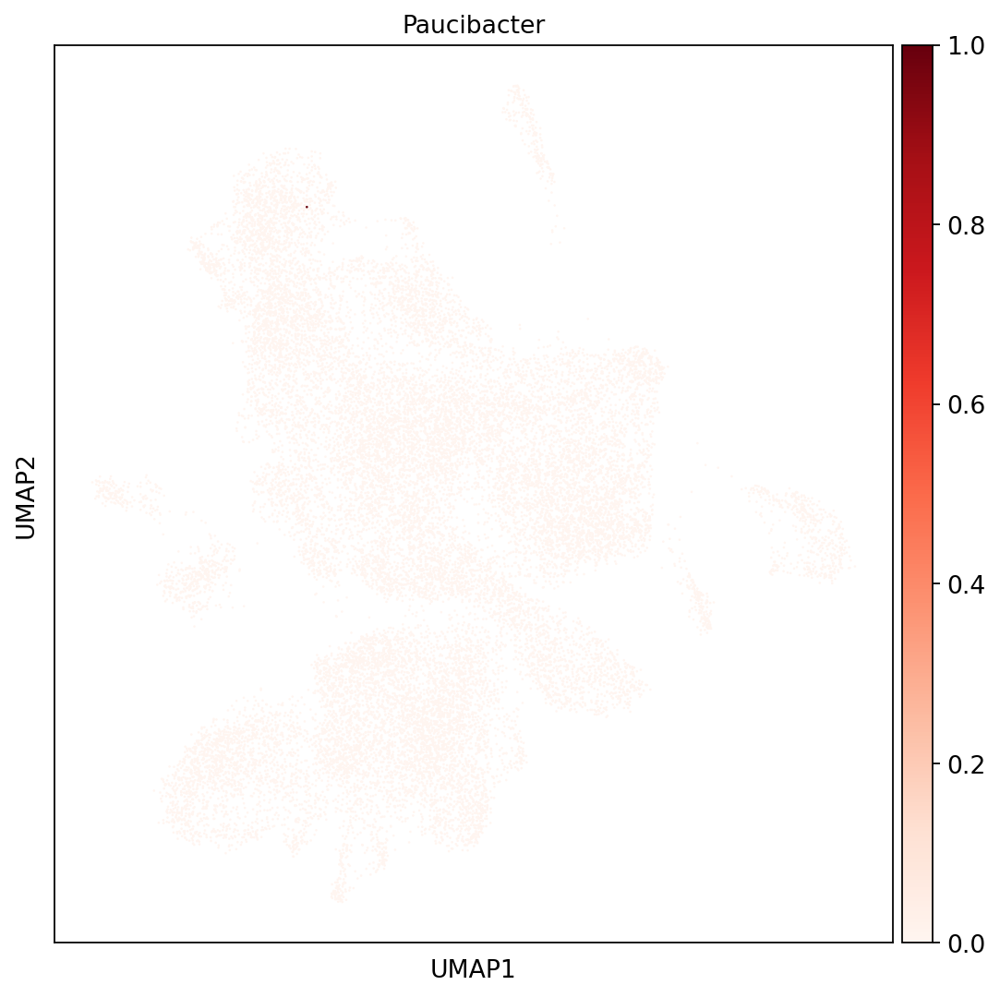

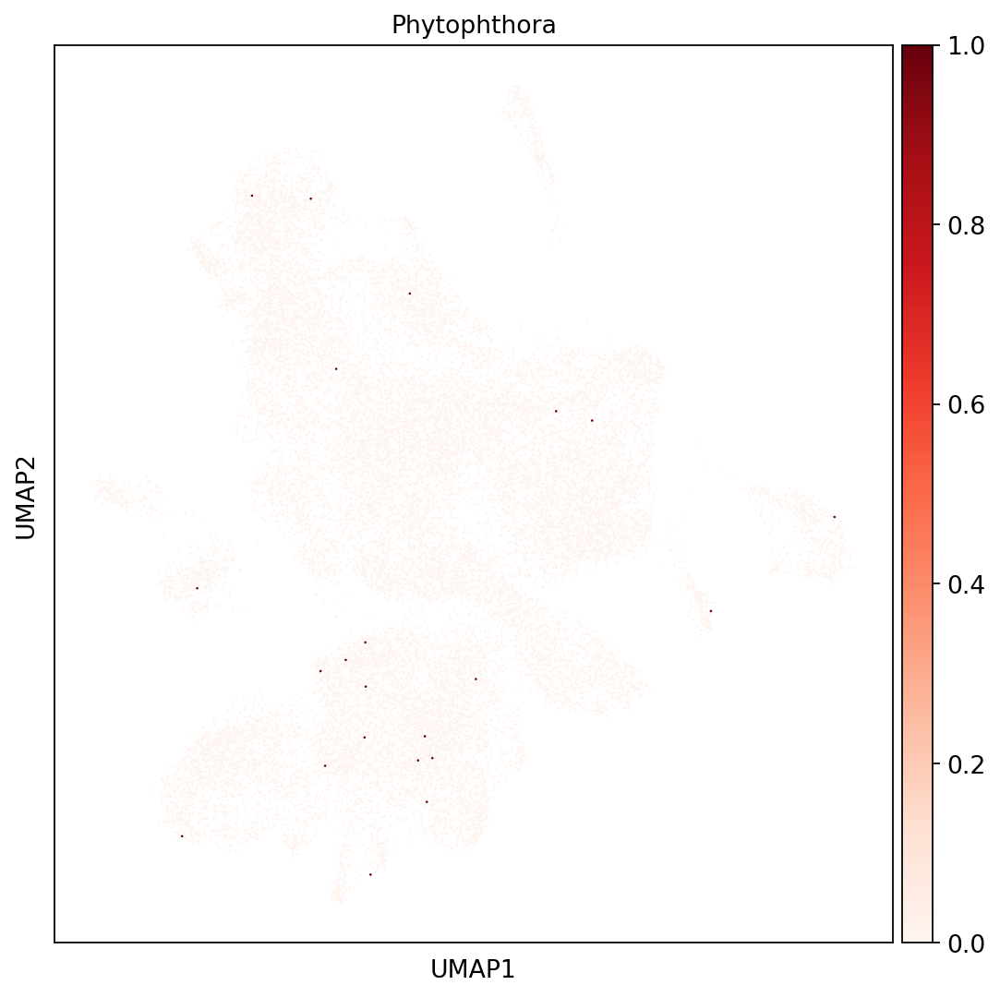

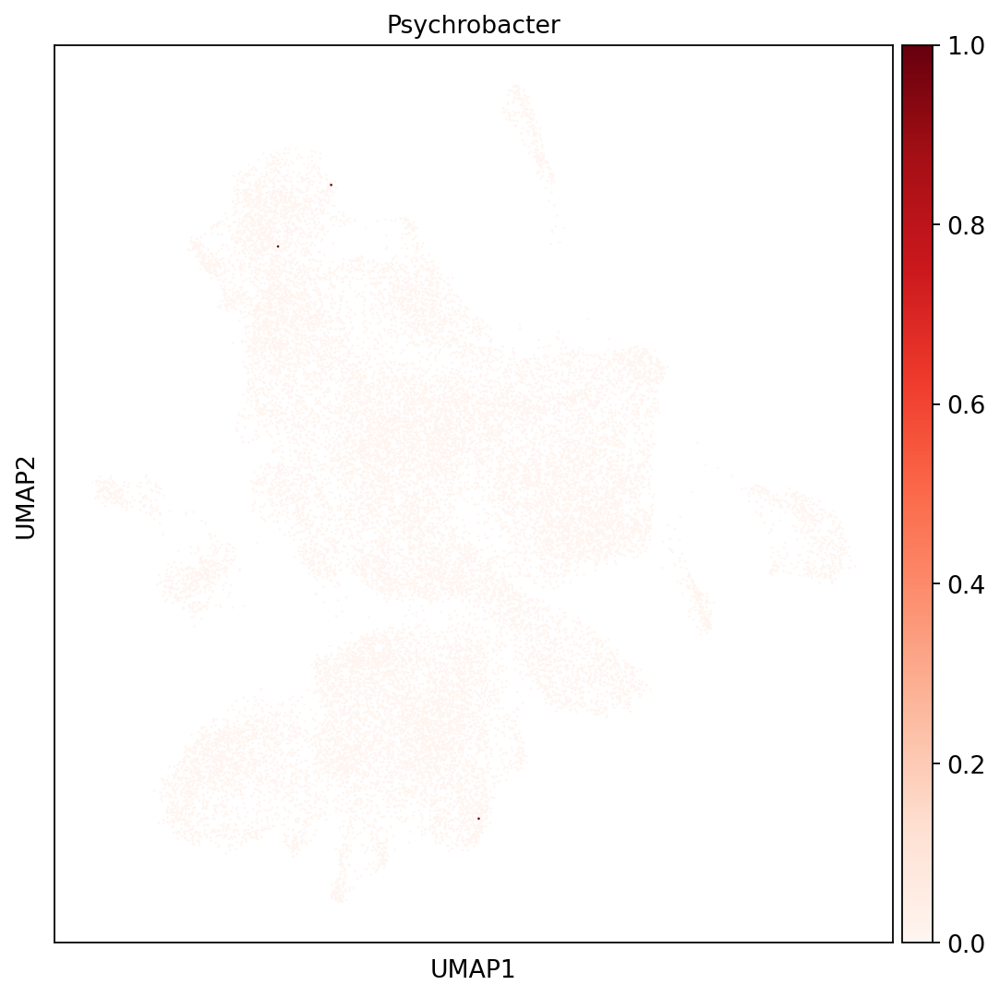

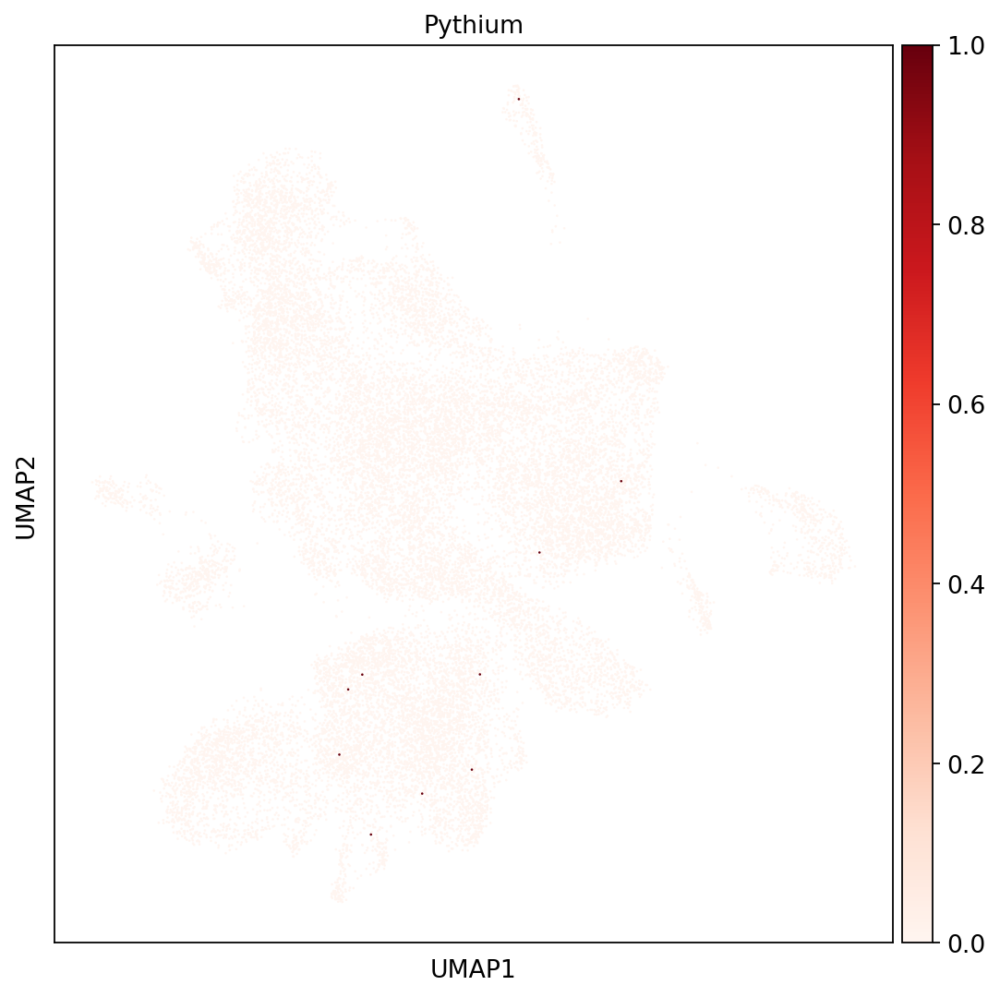

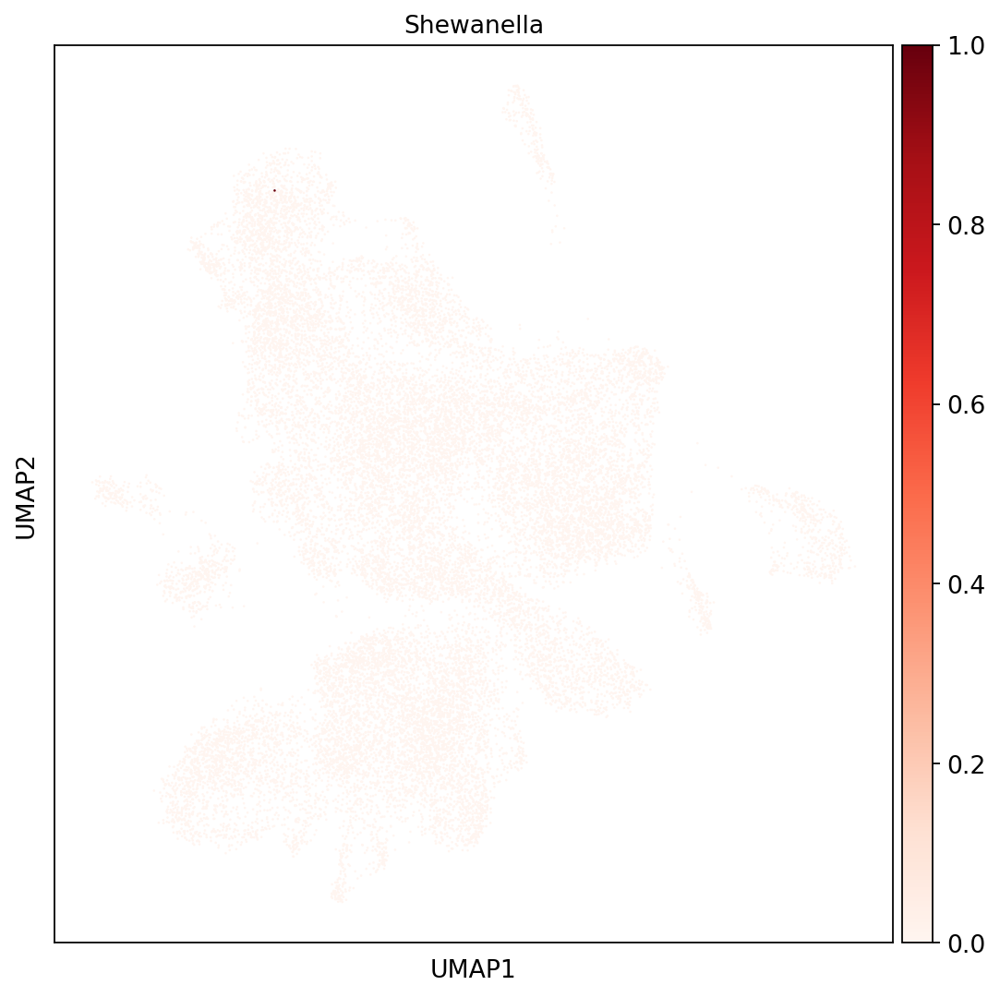

In [13]:
for mbidx in microbList:
    with plt.rc_context():  # Use this to set figure params like size and dpi
        sc.pl.umap(merged, color=mbidx, color_map='Reds', palette=sc.pl.palettes.vega_20_scanpy, show=False, vmax=1)
        plt.savefig('figures/distribution-'+mbidx+'.pdf', bbox_inches="tight")

In [14]:
ctdf = pd.DataFrame(0.0,index=merged.obs.index,columns=['X_umap1','X_umap2','cell type']+microbList)
ctdf.loc[:,'X_umap1'] = [i[0] for i in merged.obsm['X_umap']]
ctdf.loc[:,'X_umap2'] = [i[1] for i in merged.obsm['X_umap']]
ctdf.loc[:,'cell type'] = merged.obs['cell type']
ctdf.loc[:,microbList] = merged[:,microbList].to_df().astype(int)
ctdf.to_csv('figures/distribution.csv',index=True,header=True)
ctdf

/tmp/ipykernel_440724/1210079010.py:2: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  ctdf.loc[:,'X_umap1'] = [i[0] for i in merged.obsm['X_umap']]
/tmp/ipykernel_440724/1210079010.py:3: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  ctdf.loc[:,'X_umap2'] = [i[1] for i in merged.obsm['X_umap']]
/tmp/ipykernel_440724/1210079010.py:5: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals`

,X_umap1,X_umap2,cell type,Achromobacter,Acinetobacter,Burkholderia,Citrobacter,Corynebacterium,Leptotrichia,Malassezia,...,Exiguobacterium,Flavobacterium,Hymenobacter,Mycoplasma,Nonlabens,Paucibacter,Phytophthora,Psychrobacter,Pythium,Shewanella
HCC1_AAACCCAAGAAGAACG-1,0.305733,1.109887,TAMs,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
HCC1_AAACCCAAGCAACAAT-1,-2.687599,1.761434,TAMs,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
HCC1_AAACCCAAGCATCTTG-1,0.314397,-0.845972,TAMs,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
HCC1_AAACCCAAGCTGAGTG-1,-2.127700,5.886613,HPCs,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
HCC1_AAACCCACAAGGGCAT-1,-4.528558,4.375553,HPCs,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HCC2_TTTGTTGCAATACGCT-1,1.748713,-3.332506,T cells,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
HCC2_TTTGTTGCACATACGT-1,0.705331,-6.038309,T cells,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
HCC2_TTTGTTGGTTAGAAGT-1,0.992236,-4.140252,T cells,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
HCC2_TTTGTTGTCGCCTAGG-1,-5.931388,-0.230214,B cells,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# by cell type

In [16]:
rltdf = pd.DataFrame(0,index=ctList,columns=microbList)
for ct in ctList:
    #print(ct)
    ctcount = len(merged.obs.loc[merged.obs['cell type']==ct,])
    rltdf.loc[ct,'cell count'] = ctcount
    for midx in microbList:
        mbcount = len(merged.obs.loc[(merged.obs['cell type']==ct)&(microb[midx]>0),])
        #print('cell type: %s, count: %s, microb: %s' % (ct,ctcount,mbcount))
        rltdf.loc[ct,midx] = mbcount
#rltdf = rltdf.loc[:,rltdf.sum()>=10]
rltdf.to_csv('figures/Genus_count_by_cell type.csv',index=True,header=True)
rltdf

,Achromobacter,Acinetobacter,Burkholderia,Citrobacter,Corynebacterium,Leptotrichia,Malassezia,Orthohepadnavirus,Plasmodium,Pseudomonas,...,Flavobacterium,Hymenobacter,Mycoplasma,Nonlabens,Paucibacter,Phytophthora,Psychrobacter,Pythium,Shewanella,cell count
T cells,0,3,1,0,0,2,0,44,28,3,...,3,1,0,1,0,13,1,7,0,6268.0
TAMs,0,1,1,0,2,0,2,170,36,4,...,0,0,0,0,0,1,0,0,0,7426.0
HPCs,0,0,2,2,0,0,0,1825,36,2,...,1,0,1,0,1,5,2,2,1,7283.0
B cells,1,0,0,0,0,0,0,4,0,2,...,1,0,0,0,0,1,0,0,0,535.0
LSECs,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,1,0,202.0
Others,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,167.0
TAFs,0,0,0,0,0,0,0,13,5,2,...,0,0,0,0,0,1,0,0,0,460.0


In [17]:
props = pd.DataFrame(0.0,index=ctList,columns=rltdf.columns[:-1])
for ct in ctList:
    #print(ct)
    ctcount = len(merged.obs.loc[merged.obs['cell type']==ct,])
    for midx in rltdf.columns[:-1]:
        mbcount = len(merged.obs.loc[(merged.obs['cell type']==ct)&(microb[midx]>0),])
        #print('cell type: %s, count: %s, microb: %s, fraction: %s' % (ct,ctcount,mbcount,100.0*mbcount/ctcount))
        props.loc[ct,midx] = 100.0*mbcount/ctcount #%
#print(props.max().max())
props.to_csv('figures/Genus_percent_by_cell type.csv',index=True,header=True)
props

,Achromobacter,Acinetobacter,Burkholderia,Citrobacter,Corynebacterium,Leptotrichia,Malassezia,Orthohepadnavirus,Plasmodium,Pseudomonas,...,Exiguobacterium,Flavobacterium,Hymenobacter,Mycoplasma,Nonlabens,Paucibacter,Phytophthora,Psychrobacter,Pythium,Shewanella
T cells,0.000000,0.047862,0.015954,0.000000,0.000000,0.031908,0.000000,0.701978,0.446713,0.047862,...,0.015954,0.047862,0.015954,0.000000,0.015954,0.000000,0.207403,0.015954,0.111678,0.000000
TAMs,0.000000,0.013466,0.013466,0.000000,0.026932,0.000000,0.026932,2.289254,0.484783,0.053865,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.013466,0.000000,0.000000,0.000000
HPCs,0.000000,0.000000,0.027461,0.027461,0.000000,0.000000,0.000000,25.058355,0.494302,0.027461,...,0.027461,0.013731,0.000000,0.013731,0.000000,0.013731,0.068653,0.027461,0.027461,0.013731
B cells,0.186916,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.747664,0.000000,0.373832,...,0.186916,0.186916,0.000000,0.000000,0.000000,0.000000,0.186916,0.000000,0.000000,0.000000
LSECs,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.495050,0.495050,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.495050,0.000000
Others,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.598802,0.000000,0.000000,0.000000
TAFs,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.826087,1.086957,0.434783,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.217391,0.000000,0.000000,0.000000


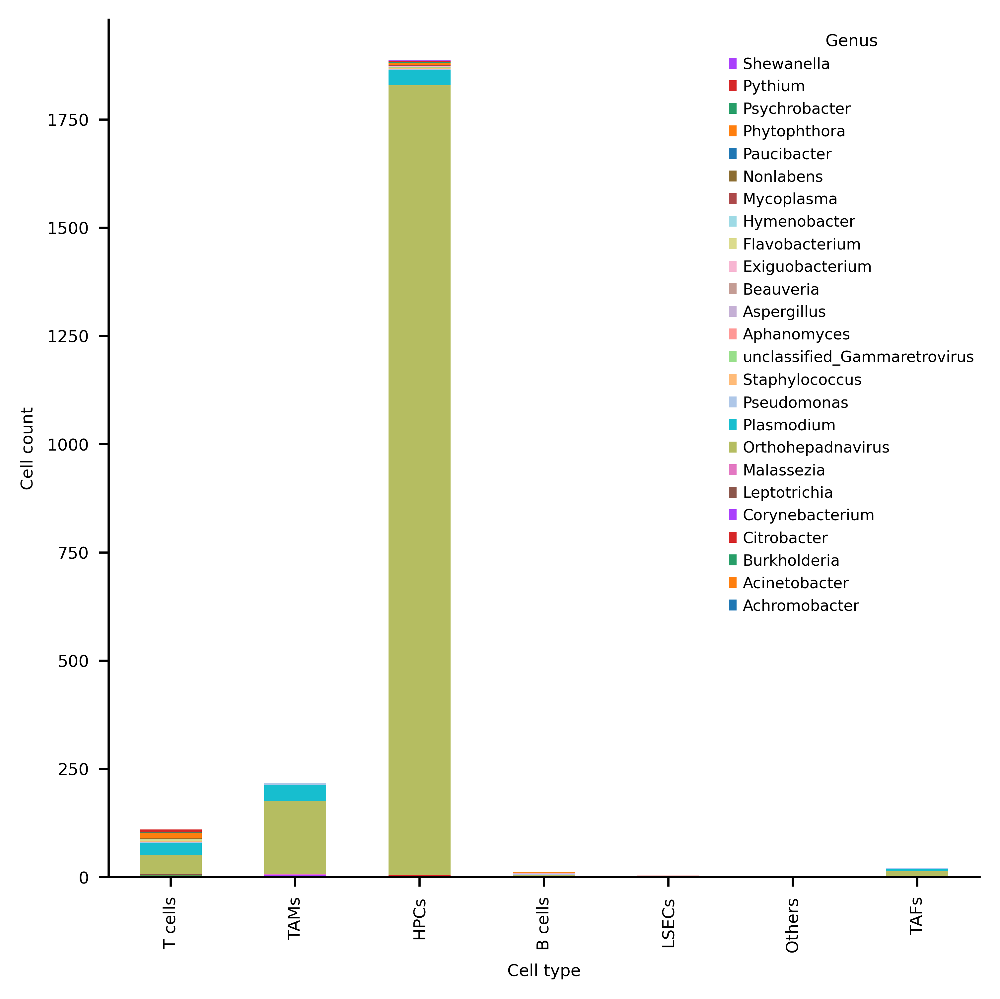

In [20]:
fig, ax = plt.subplots(dpi=300)
fig.patch.set_facecolor("white")
sc.settings.set_figure_params(fontsize=6, figsize=(5,5))
rltdf.iloc[:,:-1].plot(kind="bar", stacked=True, ax=ax, legend=None)#,colormap=ListedColormap(sc.pl.palettes.zeileis_28)
# Matplotlib idiom to reverse legend entries 
handles, labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles), reversed(labels),bbox_to_anchor=(1.01, 1), frameon=False, title="Genus")
sns.despine(fig, ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel('Cell type')
ax.set_ylabel("Cell count")
fig.tight_layout()
plt.grid(False)
plt.savefig('figures/Genus_count_by_cell type.pdf',bbox_inches='tight')

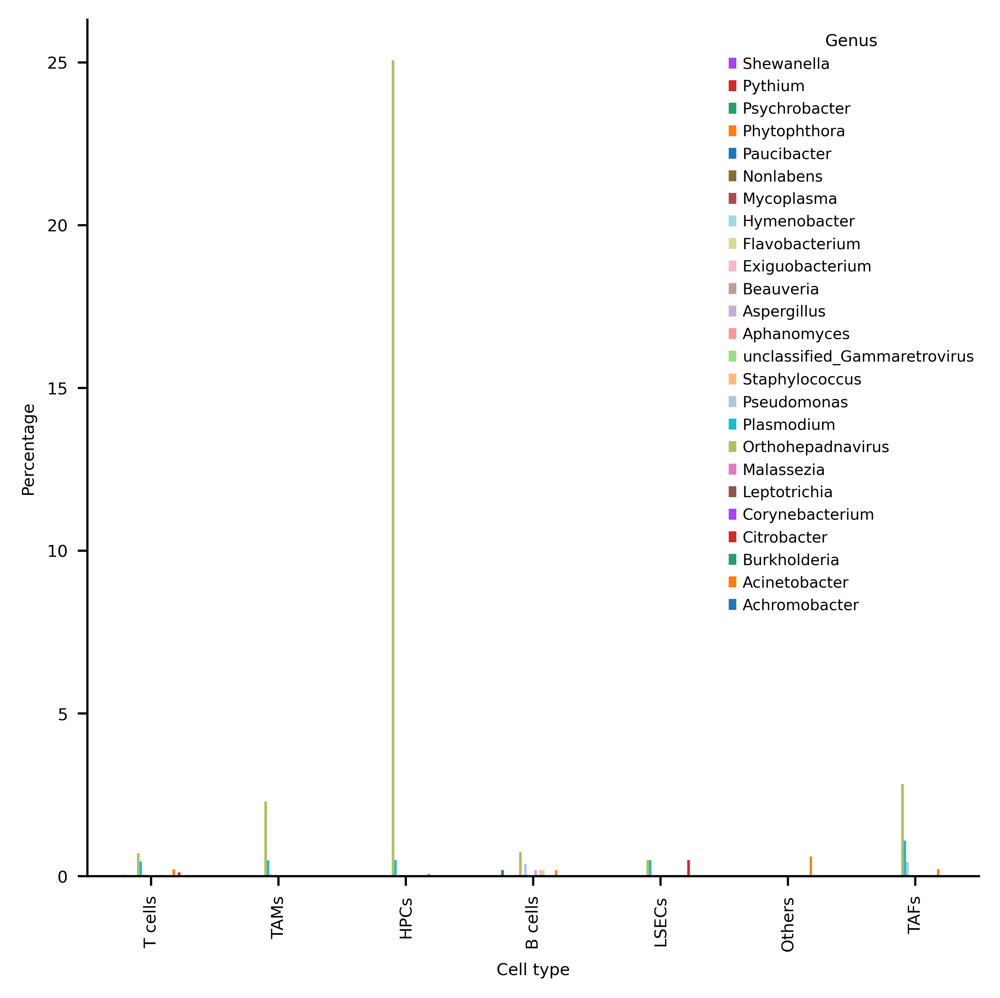

In [19]:
fig, ax = plt.subplots(dpi=300)
fig.patch.set_facecolor("white")
sc.settings.set_figure_params(fontsize=6, figsize=(5,5))
#plt.rcParams['figure.figsize']=(5,4)
props.plot(kind="bar", stacked=False, ax=ax, legend=None)#,colormap=ListedColormap(sc.pl.palettes.zeileis_28)
# Matplotlib idiom to reverse legend entries 
handles, labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles), reversed(labels),bbox_to_anchor=(1.01, 1), frameon=False, title="Genus")
sns.despine(fig, ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel('Cell type')
ax.set_ylabel("Percentage")
fig.tight_layout()
plt.grid(False)
plt.savefig('figures/Genus_percent_by_cell type.pdf',bbox_inches='tight')

# by sample

In [21]:
rltdfpt = pd.DataFrame(0,index=ptList,columns=microbList)
for pt in ptList:
    #print(pt)
    ptcount = len(merged.obs.loc[merged.obs['sample']==pt,])
    rltdfpt.loc[pt,'cell count'] = ptcount
    for midx in microbList:
        mbcount = len(merged.obs.loc[(merged.obs['sample']==pt)&(microb[midx]>0),])
        #print('cell type: %s, count: %s, microb: %s' % (pt,ptcount,mbcount))
        rltdfpt.loc[pt,midx] = mbcount
#rltdfpt = rltdfpt.loc[:,rltdfpt.sum()>=10]
rltdfpt.to_csv('figures/Genus_count_by_sample.csv',index=True,header=True)
rltdfpt

,Achromobacter,Acinetobacter,Burkholderia,Citrobacter,Corynebacterium,Leptotrichia,Malassezia,Orthohepadnavirus,Plasmodium,Pseudomonas,...,Flavobacterium,Hymenobacter,Mycoplasma,Nonlabens,Paucibacter,Phytophthora,Psychrobacter,Pythium,Shewanella,cell count
HCC1,1,2,4,1,2,1,2,2057,73,1,...,0,0,0,0,0,0,0,0,0,14855.0
HCC2,0,2,0,1,0,1,0,0,33,12,...,5,1,1,1,1,22,3,10,1,7486.0


In [22]:
propspt = pd.DataFrame(0.0,index=ptList,columns=rltdfpt.columns[:-1])
for pt in ptList:
    #print(pt)
    ptcount = len(merged.obs.loc[merged.obs['sample']==pt,])
    for midx in rltdfpt.columns[:-1]:
        mbcount = len(merged.obs.loc[(merged.obs['sample']==pt)&(microb[midx]>0),])
        #print('cell type: %s, count: %s, microb: %s, fraction: %s' % (pt,ptcount,mbcount,100.0*mbcount/ptcount))
        propspt.loc[pt,midx] = 100.0*mbcount/ptcount
print(propspt.max().max())
propspt.to_csv('figures/Genus_percent_by_sample.csv',index=True,header=True)
propspt

13.847189498485358


,Achromobacter,Acinetobacter,Burkholderia,Citrobacter,Corynebacterium,Leptotrichia,Malassezia,Orthohepadnavirus,Plasmodium,Pseudomonas,...,Exiguobacterium,Flavobacterium,Hymenobacter,Mycoplasma,Nonlabens,Paucibacter,Phytophthora,Psychrobacter,Pythium,Shewanella
HCC1,0.006732,0.013463,0.026927,0.006732,0.013463,0.006732,0.013463,13.847189,0.491417,0.006732,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
HCC2,0.000000,0.026717,0.000000,0.013358,0.000000,0.013358,0.000000,0.000000,0.440823,0.160299,...,0.053433,0.066791,0.013358,0.013358,0.013358,0.013358,0.293882,0.040075,0.133583,0.013358


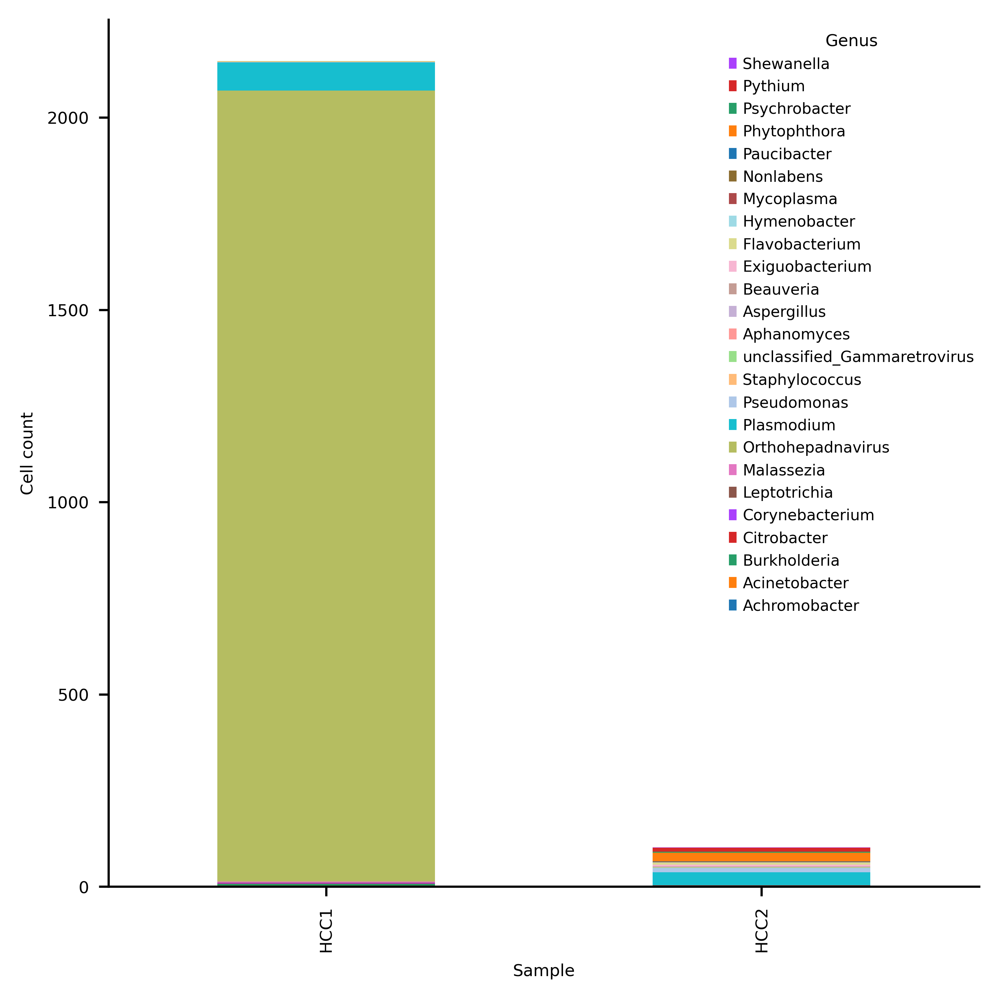

In [23]:
fig, ax = plt.subplots(dpi=300)
fig.patch.set_facecolor("white")
sc.settings.set_figure_params(fontsize=6, figsize=(5, 5))
rltdfpt.iloc[:,:-1].plot(kind="bar", stacked=True, ax=ax, legend=None)#,colormap=ListedColormap(sc.pl.palettes.zeileis_28)
# Matplotlib idiom to reverse legend entries 
handles, labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles), reversed(labels),bbox_to_anchor=(1.01, 1), frameon=False, title="Genus")
sns.despine(fig, ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel('Sample')
ax.set_ylabel("Cell count")
fig.tight_layout()
plt.grid(False)
plt.savefig('figures/Genus_count_by_sample.pdf',bbox_inches='tight')

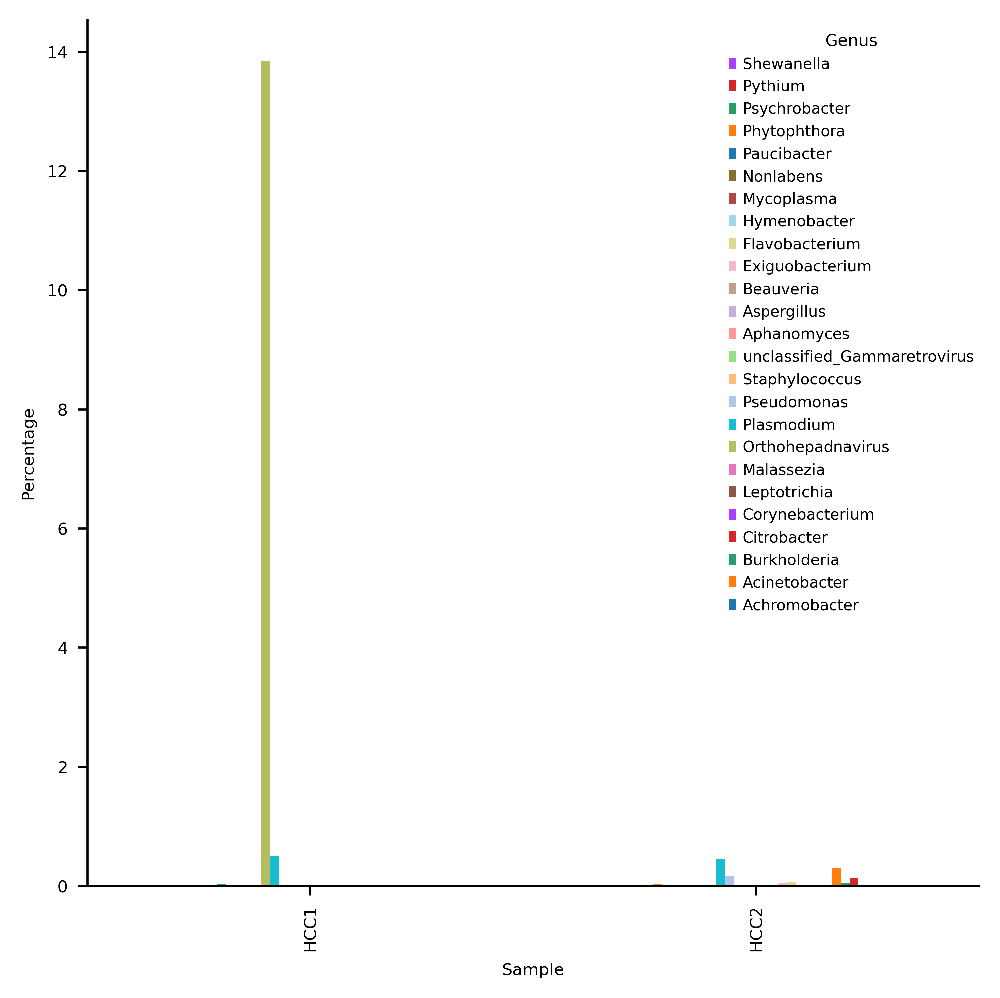

In [24]:
fig, ax = plt.subplots(dpi=300)
fig.patch.set_facecolor("white")
sc.settings.set_figure_params(fontsize=6, figsize=(5, 5))
propspt.plot(kind="bar", stacked=False, ax=ax, legend=None)#,colormap=ListedColormap(sc.pl.palettes.zeileis_28)
# Matplotlib idiom to reverse legend entries 
handles, labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles), reversed(labels),bbox_to_anchor=(1.01, 1), frameon=False, title="Genus")
sns.despine(fig, ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel('Sample')
ax.set_ylabel("Percentage")
fig.tight_layout()
plt.grid(False)
plt.savefig('figures/Genus_percent_by_sample.pdf',bbox_inches='tight')

# tsne

In [25]:
cpList = [i+'_'+j for i in ptList for j in ctList]
couple_df = pd.DataFrame(0,index=cpList,columns=microbList)
for cp in cpList:
    pt = cp.split('_')[0]
    ct = cp.split('_')[1]
    ccount = len(merged.obs.loc[(merged.obs['cell type']==ct)&(merged.obs['sample']==pt),])
    couple_df.loc[cp,'cell count'] = ccount
    for midx in microbList:
        mbcount = len(merged.obs.loc[(merged.obs['cell type']==ct)&(merged.obs['sample']==pt)&(microb[midx]>0),])
        couple_df.loc[cp,midx] = mbcount
couple_df

,Achromobacter,Acinetobacter,Burkholderia,Citrobacter,Corynebacterium,Leptotrichia,Malassezia,Orthohepadnavirus,Plasmodium,Pseudomonas,...,Flavobacterium,Hymenobacter,Mycoplasma,Nonlabens,Paucibacter,Phytophthora,Psychrobacter,Pythium,Shewanella,cell count
HCC1_T cells,0,1,1,0,0,1,0,44,13,0,...,0,0,0,0,0,0,0,0,0,2663.0
HCC1_TAMs,0,1,1,0,2,0,2,170,34,1,...,0,0,0,0,0,0,0,0,0,6923.0
HCC1_HPCs,0,0,2,1,0,0,0,1825,22,0,...,0,0,0,0,0,0,0,0,0,4690.0
HCC1_B cells,1,0,0,0,0,0,0,4,0,0,...,0,0,0,0,0,0,0,0,0,187.0
HCC1_LSECs,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,32.0
HCC1_Others,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,13.0
HCC1_TAFs,0,0,0,0,0,0,0,13,4,0,...,0,0,0,0,0,0,0,0,0,347.0
HCC2_T cells,0,2,0,0,0,1,0,0,15,3,...,3,1,0,1,0,13,1,7,0,3605.0
HCC2_TAMs,0,0,0,0,0,0,0,0,2,3,...,0,0,0,0,0,1,0,0,0,503.0
HCC2_HPCs,0,0,0,1,0,0,0,0,14,2,...,1,0,1,0,1,5,2,2,1,2593.0


In [37]:
couple_pc = pd.DataFrame(0.0,index=cpList,columns=microbList)
for i in couple_pc.index:
    couple_pc.loc[i,microbList]= couple_df.loc[i,microbList]/couple_df.loc[i,'cell count']
couple_pc

,Achromobacter,Acinetobacter,Burkholderia,Citrobacter,Corynebacterium,Leptotrichia,Malassezia,Orthohepadnavirus,Plasmodium,Pseudomonas,...,Exiguobacterium,Flavobacterium,Hymenobacter,Mycoplasma,Nonlabens,Paucibacter,Phytophthora,Psychrobacter,Pythium,Shewanella
HCC1_T cells,0.000000,0.000376,0.000376,0.000000,0.000000,0.000376,0.000000,0.016523,0.004882,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
HCC1_TAMs,0.000000,0.000144,0.000144,0.000000,0.000289,0.000000,0.000289,0.024556,0.004911,0.000144,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
HCC1_HPCs,0.000000,0.000000,0.000426,0.000213,0.000000,0.000000,0.000000,0.389126,0.004691,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
HCC1_B cells,0.005348,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.021390,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
HCC1_LSECs,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.031250,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
HCC1_Others,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
HCC1_TAFs,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.037464,0.011527,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
HCC2_T cells,0.000000,0.000555,0.000000,0.000000,0.000000,0.000277,0.000000,0.000000,0.004161,0.000832,...,0.000277,0.000832,0.000277,0.000000,0.000277,0.000000,0.003606,0.000277,0.001942,0.000000
HCC2_TAMs,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003976,0.005964,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001988,0.000000,0.000000,0.000000
HCC2_HPCs,0.000000,0.000000,0.000000,0.000386,0.000000,0.000000,0.000000,0.000000,0.005399,0.000771,...,0.000771,0.000386,0.000000,0.000386,0.000000,0.000386,0.001928,0.000771,0.000771,0.000386


In [38]:
couple = sc.AnnData(couple_pc)
couple.obs['cell type'] = [i.split('_')[1] for i in couple.obs.index]
couple.obs['sample'] = [i.split('_')[0] for i in couple.obs.index]
couple

/tmp/ipykernel_440724/629934527.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  couple = sc.AnnData(couple_pc)


AnnData object with n_obs × n_vars = 14 × 25
    obs: 'cell type', 'sample'

/data/hour/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


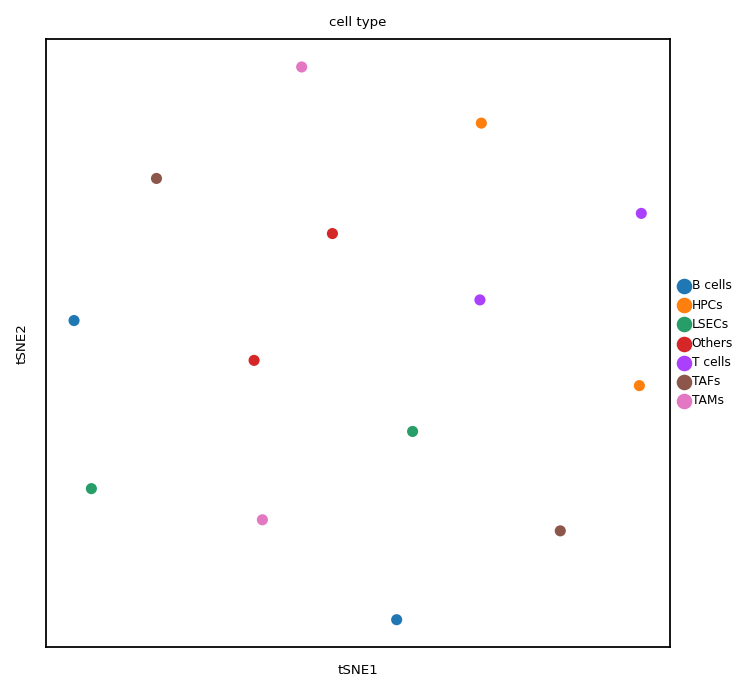

In [39]:
sc.tl.tsne(couple)
sc.pl.tsne(couple,color='cell type',size=100,save='.pdf')

In [40]:
tsne_df = pd.DataFrame(0.0,index=couple.obs.index,columns=['X_tsne1','X_tsne2'])
tsne_df.loc[:,'X_tsne1'] = [i[0] for i in couple.obsm['X_tsne']]
tsne_df.loc[:,'X_tsne2'] = [i[1] for i in couple.obsm['X_tsne']]
tsne_df.to_csv('figures/tsne.csv',index=True,header=True)
tsne_df

/tmp/ipykernel_440724/766542369.py:2: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  tsne_df.loc[:,'X_tsne1'] = [i[0] for i in couple.obsm['X_tsne']]
/tmp/ipykernel_440724/766542369.py:3: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  tsne_df.loc[:,'X_tsne2'] = [i[1] for i in couple.obsm['X_tsne']]


,X_tsne1,X_tsne2
HCC1_T cells,1218.337891,1003.737305
HCC1_TAMs,-648.329163,-698.323608
HCC1_HPCs,430.203278,1505.209229
HCC1_B cells,-1576.314941,408.503174
HCC1_LSECs,-1490.850708,-525.258301
HCC1_Others,-303.406219,891.681702
HCC1_TAFs,-1170.137939,1197.890625
HCC2_T cells,423.303101,523.118286
HCC2_TAMs,-454.878876,1817.076294
HCC2_HPCs,1208.794556,46.884766


In [41]:
from skbio import DistanceMatrix
from skbio.stats.distance import permanova
from scipy.spatial.distance import cdist

In [42]:
distance_matrix = cdist(couple.obsm['X_tsne'],couple.obsm['X_tsne'],'euclidean') # euclidean表示欧式距离
dm = DistanceMatrix(distance_matrix,couple.obs.index)
print(dm)

14x14 distance matrix
IDs:
'HCC1_T cells', 'HCC1_TAMs', 'HCC1_HPCs', 'HCC1_B cells', 'HCC1_LSECs', ...
Data:
[[   0.         2526.1546349   934.14680787 2857.33934319 3110.87293609
  1525.86421244 2396.35396022  929.01827666 1860.42324719  956.90012893
  2558.65007787 1654.38356987 2075.04423906 1808.15083015]
 [2526.1546349     0.         2453.32207178 1444.37638153  860.11287351
  1626.98762217 1966.70099877 1624.90492313 2522.82771552 2001.06072513
   863.41627161  887.83318892  886.53727355 1468.77949468]
 [ 934.14680787 2453.32207178    0.         2286.6743392  2795.21856088
   956.34665284 1629.5817669   982.11518243  938.41967404 1653.15293224
  2789.84394883 1745.98498518 1729.25487981 2298.16517373]
 [2857.33934319 1444.37638153 2286.6743392     0.          937.66445313
  1361.52785653  887.7568952  2002.90013177 1800.47135054 2808.48763284
  2299.52557686 1778.05387076  914.1637786  2665.19248313]
 [3110.87293609  860.11287351 2795.21856088  937.66445313    0.
  1848.71398108

In [43]:
grouping = couple.obs['cell type']
pmnvRlt_999 = permanova(dm, grouping, permutations=999)
pmnvRlt_999 #pmnvRlt_999['p-value']

method name               PERMANOVA
test statistic name        pseudo-F
sample size                      14
number of groups                  7
test statistic             0.781739
p-value                        0.66
number of permutations          999
Name: PERMANOVA results, dtype: object

# statistics

In [44]:
print('Gene count: %s' % (len(em.raw.to_adata().var)))
print('Total cell count: %s' % (len(em.obs)))
print('Total infected cell count: %s' % (len(microb.loc[microb.max(axis=1)>0,:])))
print('Genus count: %s' % (len(microbList)))
print('PERMANOVA p-value: %s' % (pmnvRlt_999['p-value']))
file = open('figures/GSE166635-statistic.csv','w')
file.write('Gene count:'+str(len(em.raw.to_adata().var))+'\n'
           +'Total cell count:'+str(len(em.obs))+'\n'
           +'Total infected cell count:'+str(len(microb.loc[microb.max(axis=1)>0,:]))+'\n'
           +'Genus count:'+str(len(microbList))+'\n'
           +'PERMANOVA p-value:'+str((pmnvRlt_999['p-value']))+'\n')
#file.close()

Gene count: 23085
Total cell count: 22341
Total infected cell count: 2237
Genus count: 25
PERMANOVA p-value: 0.66


109

In [45]:
#file = open('figures/GSE156405-statistic.csv','w')
file.write('Sample ID'+','+'Cell type'+','+'Cell count'+','+'Infected cell count'+','+'Infection rate(%)'+','+'Genus count'+'\n')
for cp in couple_df.index:
    pt = cp.split('_')[0]
    ct = cp.split('_')[1]
    cc = couple_df.loc[cp,'cell count'] #Cell count
    icc = couple_df.loc[cp,microbList].sum() #Infected cell count
    ir = (icc/cc)*100 #Infection rate(%)
    gc = np.count_nonzero(couple_df.loc[cp,microbList]) #Genus count
    file.write(pt+','+ct+','+str(cc)+','+str(icc)+','+str(ir)+','+str(gc)+'\n')
file.close()